Kelompok 5

Nama anggota:


1.   Adhilah Shafiyah Azzahra (19/446446/TK/49552)
2.   Rosyiidah Dhiya’Ulhaq (19/446468/TK/49573)
3.   Salma Nurhaliza Pribadi (19/446469/TK/49574)



Load Multiple Data

In [ ]:
!cp -r "/content/Image Data" "/content/"

cp: '/content/Image Data' and '/content/Image Data' are the same file


In [ ]:
import glob

In [ ]:
file_extensions  = [".tif"]
file_paths = []
data = file_paths
for file_ext in file_extensions :
  file_paths += glob.glob("/content/Image Data*"+"/*"+file_ext)

In [ ]:
print(file_paths)

['/content/Image Data/29_training.tif', '/content/Image Data/35_training.tif', '/content/Image Data/25_training.tif', '/content/Image Data/38_training.tif', '/content/Image Data/19_test.tif', '/content/Image Data/18_test.tif', '/content/Image Data/06_test.tif', '/content/Image Data/37_training.tif', '/content/Image Data/07_test.tif', '/content/Image Data/33_training.tif', '/content/Image Data/12_test.tif', '/content/Image Data/22_training.tif', '/content/Image Data/17_test.tif', '/content/Image Data/26_training.tif', '/content/Image Data/24_training.tif', '/content/Image Data/27_training.tif', '/content/Image Data/14_test.tif', '/content/Image Data/28_training.tif', '/content/Image Data/01_test.tif', '/content/Image Data/15_test.tif', '/content/Image Data/16_test.tif', '/content/Image Data/32_training.tif', '/content/Image Data/08_test.tif', '/content/Image Data/10_test.tif', '/content/Image Data/30_training.tif', '/content/Image Data/34_training.tif', '/content/Image Data/21_training.

In [ ]:
sorted_file_paths = sorted(file_paths)
print(sorted_file_paths)

['/content/Image Data/01_test.tif', '/content/Image Data/02_test.tif', '/content/Image Data/03_test.tif', '/content/Image Data/04_test.tif', '/content/Image Data/05_test.tif', '/content/Image Data/06_test.tif', '/content/Image Data/07_test.tif', '/content/Image Data/08_test.tif', '/content/Image Data/09_test.tif', '/content/Image Data/10_test.tif', '/content/Image Data/11_test.tif', '/content/Image Data/12_test.tif', '/content/Image Data/13_test.tif', '/content/Image Data/14_test.tif', '/content/Image Data/15_test.tif', '/content/Image Data/16_test.tif', '/content/Image Data/17_test.tif', '/content/Image Data/18_test.tif', '/content/Image Data/19_test.tif', '/content/Image Data/20_test.tif', '/content/Image Data/21_training.tif', '/content/Image Data/22_training.tif', '/content/Image Data/23_training.tif', '/content/Image Data/24_training.tif', '/content/Image Data/25_training.tif', '/content/Image Data/26_training.tif', '/content/Image Data/27_training.tif', '/content/Image Data/28_tr

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

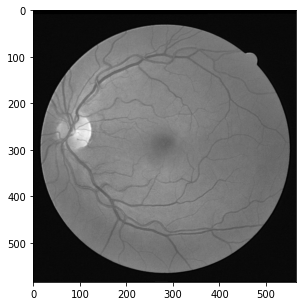

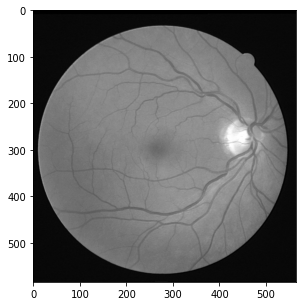

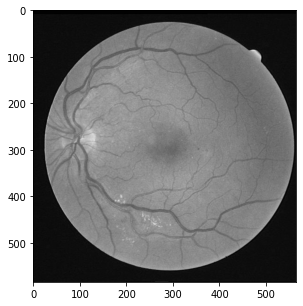

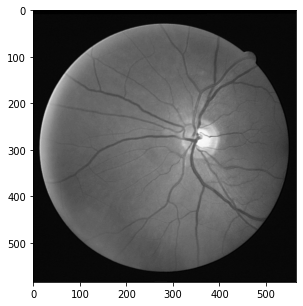

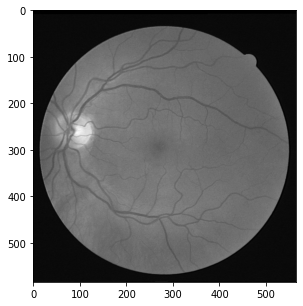

...

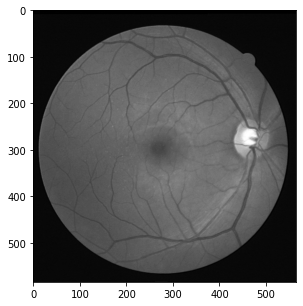

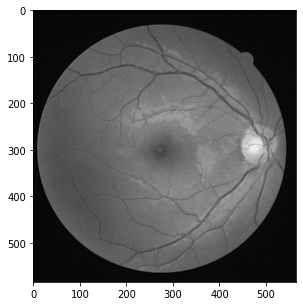

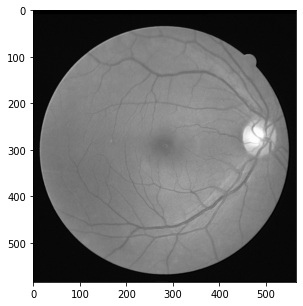

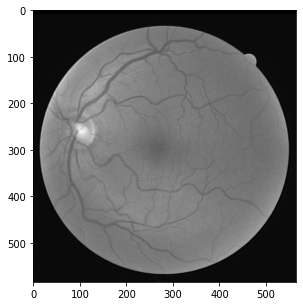

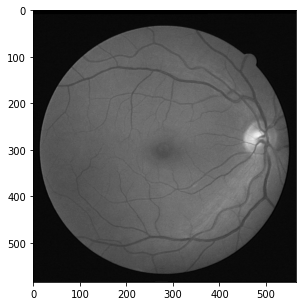

In [ ]:
# GRAYSCALE IMAGES
for i in sorted_file_paths:
  images = cv2.imread(i, cv2.IMREAD_GRAYSCALE)
  plt.figure(figsize=(10,5))
  plt.imshow(images, cmap='gray')
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


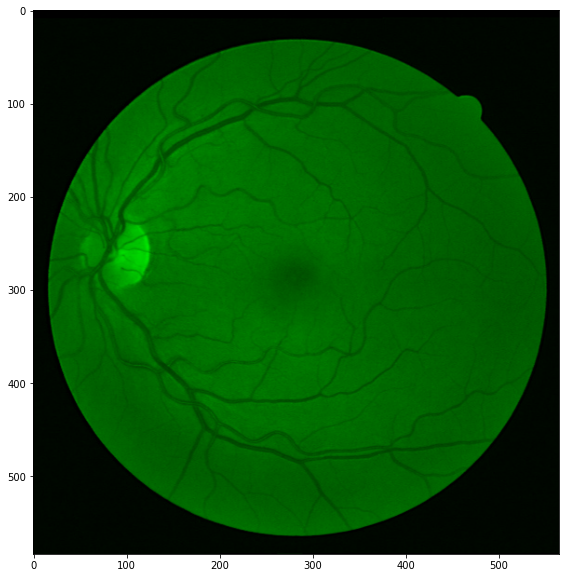

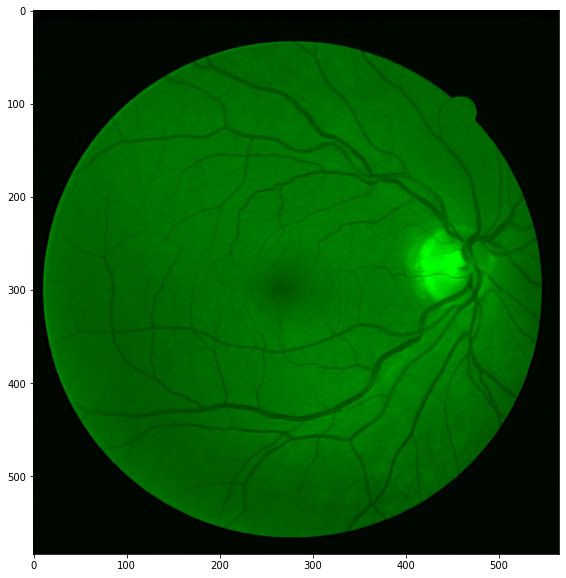

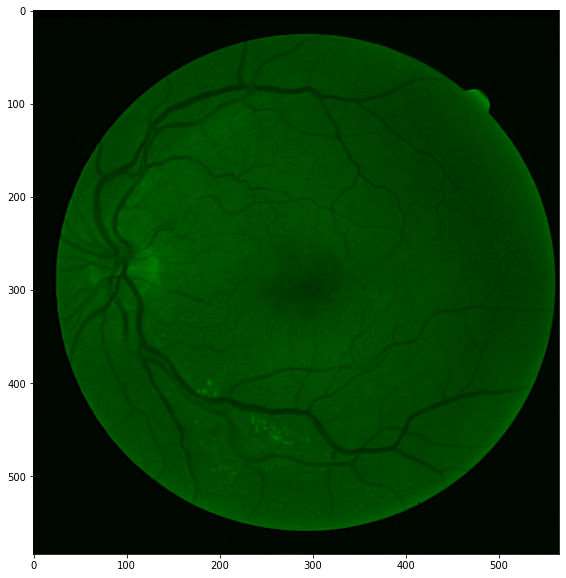

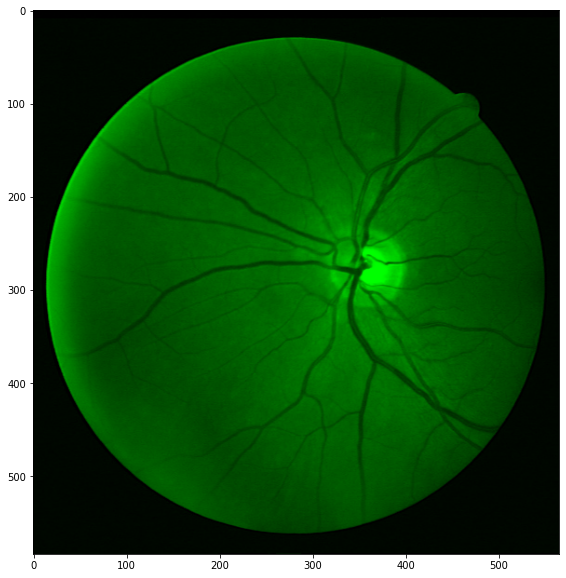

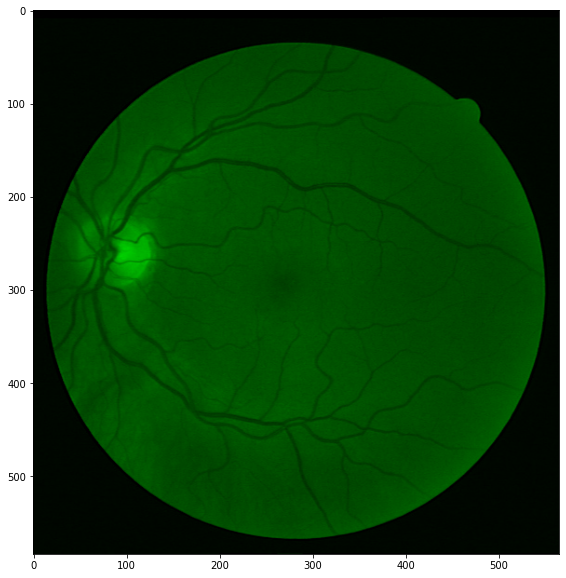

...

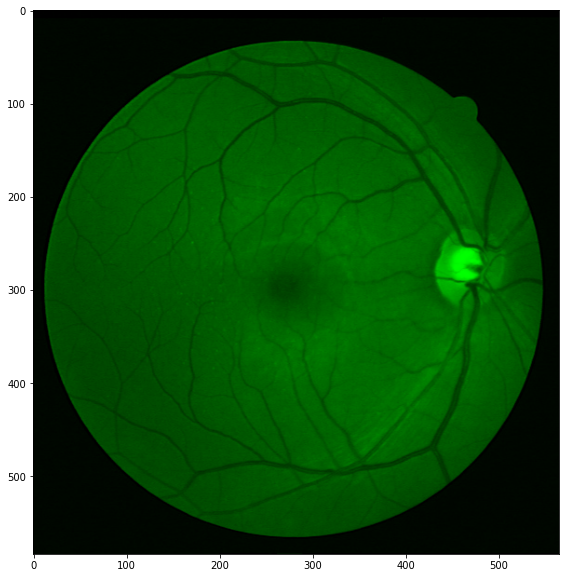

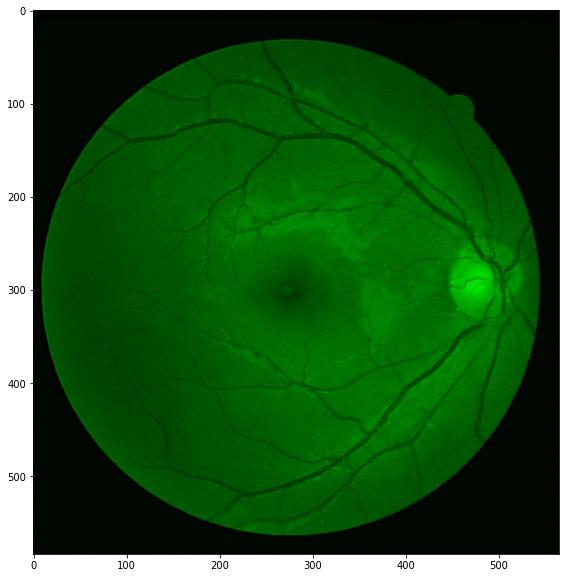

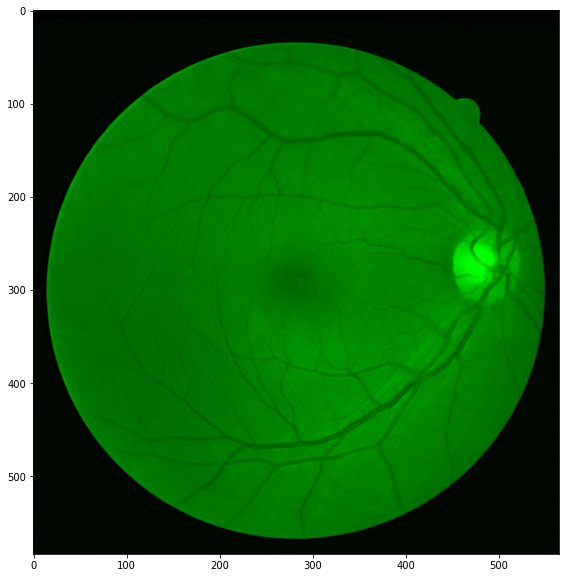

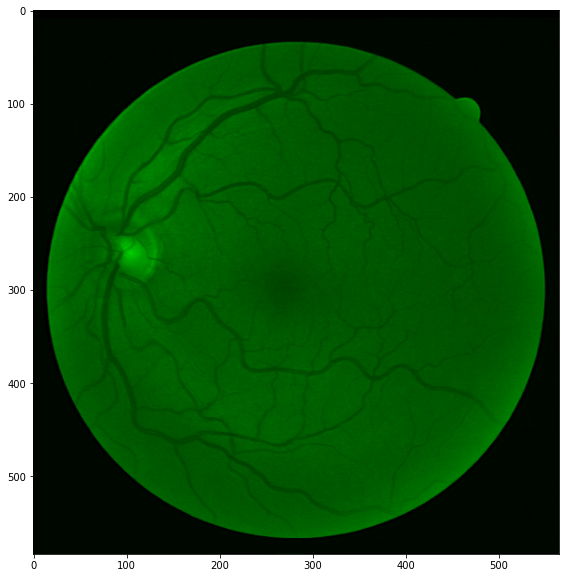

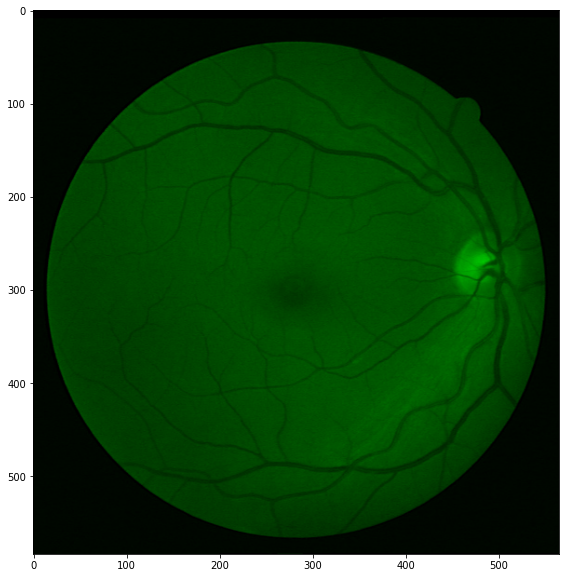

In [ ]:
# GREEN CHANNEL IMAGES
for i in sorted_file_paths:
  images = cv2.imread(i)
  img_rgb = cv2.cvtColor(images, cv2.COLOR_BGR2RGB)
  G = images.copy()
  G[:,:,0] = G[:,:,2] = 0
  fig = plt.figure(figsize=(10,10))
  #cv2.imwrite('/content/green.jpg', G)
  plt.imshow (G)

In [ ]:
def segmentasi(img, t=8, A=200,L=50):
    # Green Channel
    g = img[:,:,1]

    #Membuat mask
    _, mask = cv2.threshold(g, 10, 255, cv2.THRESH_BINARY)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    mask = cv2.erode(mask, kernel, iterations=3)

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit = 5, tileGridSize=(9,9))
    g_cl = clahe.apply(g)
    g_cl1 = cv2.medianBlur(g_cl, 5)
    bg = cv2.GaussianBlur(g_cl1, (55, 55), 0) #Background estimation
    #plt.imshow(bg, cmap='gray') #untuk melihat hasil clahe filtering

    # Background subtraction
    norm = np.float32(bg) - np.float32(g_cl1)
    norm = norm*(norm>0)

    # Global thresholding
    _, t = cv2.threshold(norm, t, 255, cv2.THRESH_BINARY)

    # contour coloring untuk menghilangkan noise
    t = np.uint8(t)
    th = t.copy()
    contours, hierarchy = cv2.findContours(t, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    for c in contours:
        if ( cv2.contourArea(c)< A):
            cv2.drawContours(th, [c], 0, 0, -1)
    th = th*(mask/255)
    th = np.uint8(th)
    plt.imshow(th, cmap='gray') #melihat hasil akhir segmentasi

    # Distance transform untuk mencari maximum diameter
    vessels = th.copy()
    _,ves = cv2.threshold(vessels, 30, 255, cv2.THRESH_BINARY)
    dist = cv2.distanceTransform(vessels, cv2.DIST_L2, 3)
    _,mv,_,mp = cv2.minMaxLoc(dist)
    print("Maximum diameter:",mv*2,"at the point:", mp)

    # Skeletonization: Zhang-seun's thinning algorithm
    thinned = cv2.ximgproc.thinning(th)
    #plt.imshow(thinned, cmap='gray') #melihat hasil skeletonisasi

    # Morphological closing untuk mengisi broken line
    kernel = np.ones((1, 10), np.uint8)
    d_im = cv2.dilate(thinned, kernel)
    e_im = cv2.erode(d_im, kernel)
    num_rows, num_cols = thinned.shape
    for i in range (1, 360//15):
        rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 15*i, 1)
        img_rotation = cv2.warpAffine(thinned, rotation_matrix, (num_cols, num_rows))
        temp_d_im = cv2.dilate(img_rotation, kernel)
        temp_e_im = cv2.erode(temp_d_im, kernel)
        rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), -15*i, 1)
        im = cv2.warpAffine(temp_e_im, rotation_matrix, (num_cols, num_rows))
        e_im = np.maximum(im, e_im)
    #plt.imshow(e_im, cmap='gray') #melihat hasil morphological closing

    # Skeletonizing (2) untuk menghilangkan sisa noise menggunakan Zhang-seun's thinning algorithm
    thinned1 = cv2.ximgproc.thinning(e_im)
    thinned1 = thinned1*(mask/255)
    #plt.imshow(thinned1, cmap='gray') #melihat hasil skeletonisasi (2)

    # Menghapus bifurcation points
    thinned1 = np.uint8(thinned1)
    thh = thinned1.copy()
    hi = thinned1.copy()
    thi = thinned1.copy()
    hi = cv2.cvtColor(hi, cv2.COLOR_GRAY2BGR)
    thi = cv2.cvtColor(thi, cv2.COLOR_GRAY2BGR)
    thh = thh/255
    kernel1 = np.array([[1,0,1],[0,1,0],[0,1,0]])
    kernel2 = np.array([[0,1,0],[1,1,1],[0,0,0]])
    kernel3 = np.array([[0,1,0],[0,1,1],[1,0,0]])
    kernel4 = np.array([[1,0,1],[0,1,0],[0,0,1]])
    kernel5 = np.array([[1,0,1],[0,1,0],[1,0,1]])
    kernels = [kernel1, kernel2, kernel3, kernel4, kernel5]
    for k in kernels:
        k1 = k
        k2 = cv2.rotate(k1, cv2.ROTATE_90_CLOCKWISE)
        k3 = cv2.rotate(k2, cv2.ROTATE_90_CLOCKWISE)
        k4 = cv2.rotate(k3, cv2.ROTATE_90_CLOCKWISE)
        ks = [k1, k2, k3, k4]
        for kernel in ks:
            th = cv2.filter2D(thh, -1, kernel)
            for i in range(th.shape[0]):
                for j in range(th.shape[1]):
                    if(th[i,j]==4.0):
                        cv2.circle(hi, (j, i), 2, (0, 255, 0), 2)
                        cv2.circle(thi, (j, i), 2, (0, 0, 0), 2)

    plt.figure(figsize=(20, 14))
    thi = cv2.cvtColor(thi, cv2.COLOR_BGR2GRAY)
    #plt.imshow(hi, cmap='gray')  #melihat gambar yang berisi titik bifurkasi

    # Menghapus centerlines yang memiliki panjang kurang dari L=50px
    cl = thi.copy()
    contours, hierarchy = cv2.findContours(thi, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    for c in contours:
        if (c.size<L):
            cv2.drawContours(cl, [c], 0, 0, -1)
    #plt.imshow(hierarchy, cmap='gray') #melihat hasil gambar


    # Centerline superimposed on green channel
    colors = [(100, 0, 150), (102, 0, 255), (0, 128, 255), (255, 255, 0), (10, 200, 10)]
    colbgr = [(193, 182, 255), (255, 0, 102), (255, 128, 0), (0, 255, 255), (10, 200, 10)]

    im = g.copy()
    im = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)
    thc = cl
    thh = thc.copy()
    thh = cv2.cvtColor(thh, cv2.COLOR_GRAY2BGR)
    contours, heirarchy = cv2.findContours(thc, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    for c in contours:

            color = np.random.randint(len(colors))
            cv2.drawContours(im, c, -1, colbgr[color], 2, cv2.LINE_AA)
    #plt.imshow(thh, cmap='gray')

    #plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)) #melihat hasil contour coloring

    cv2.waitKey()
    cv2.destroyAllWindows()

    # Estimasi diameter maksimum
    d = mv*1.5

    return im, cl, d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


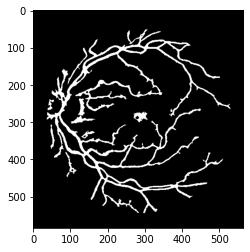

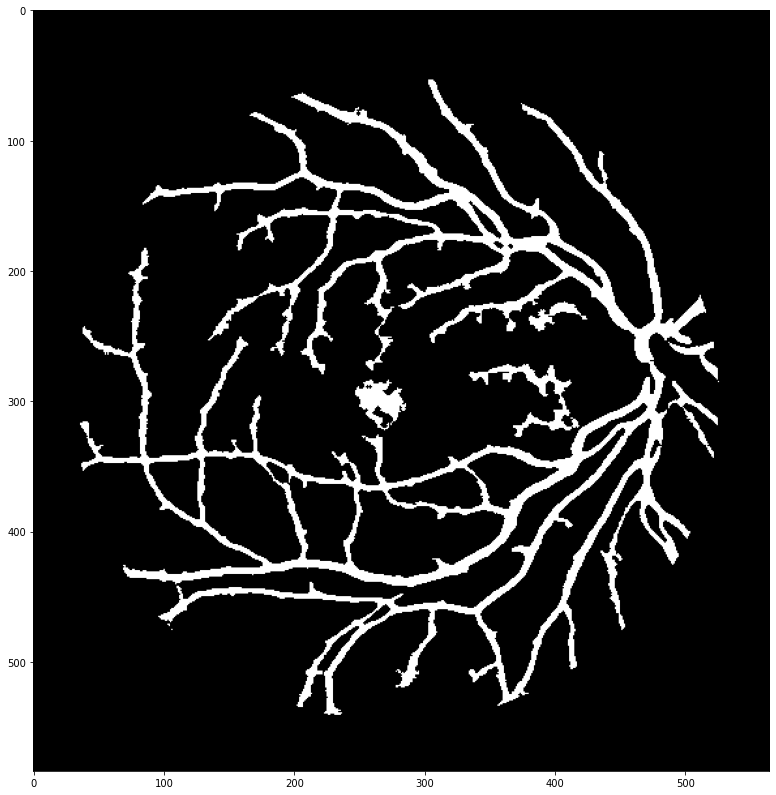

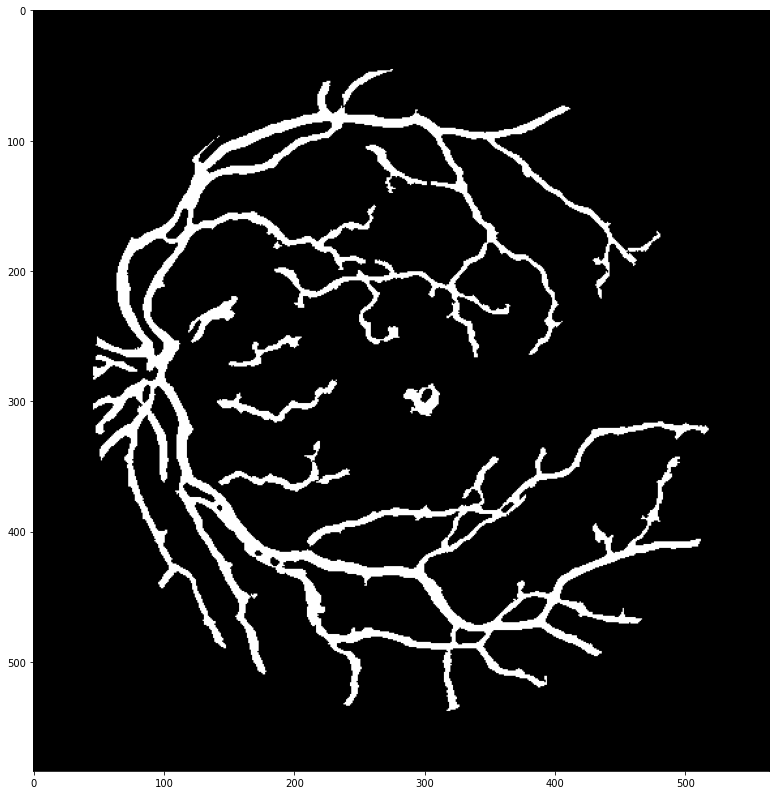

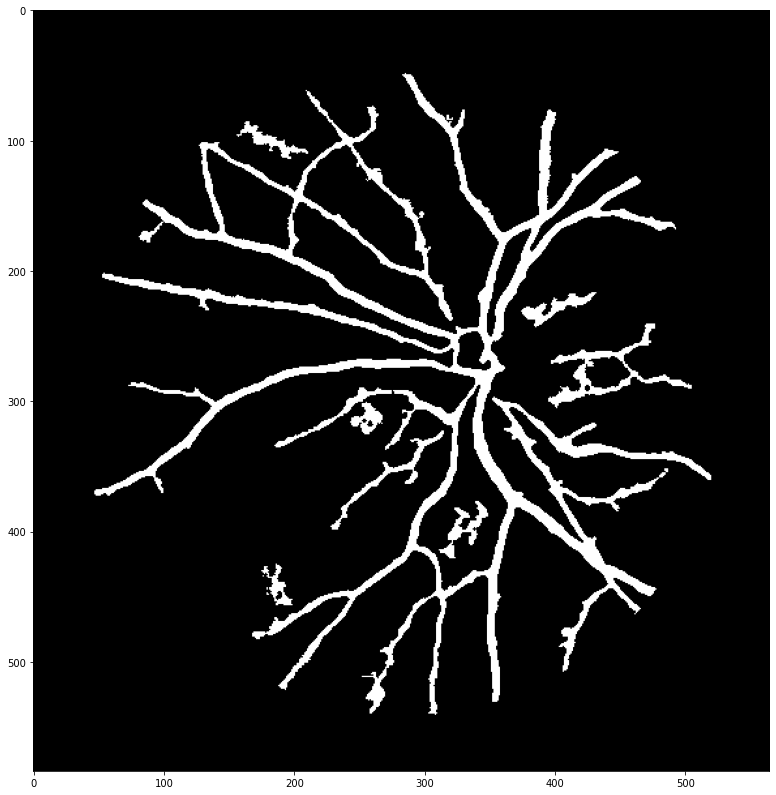

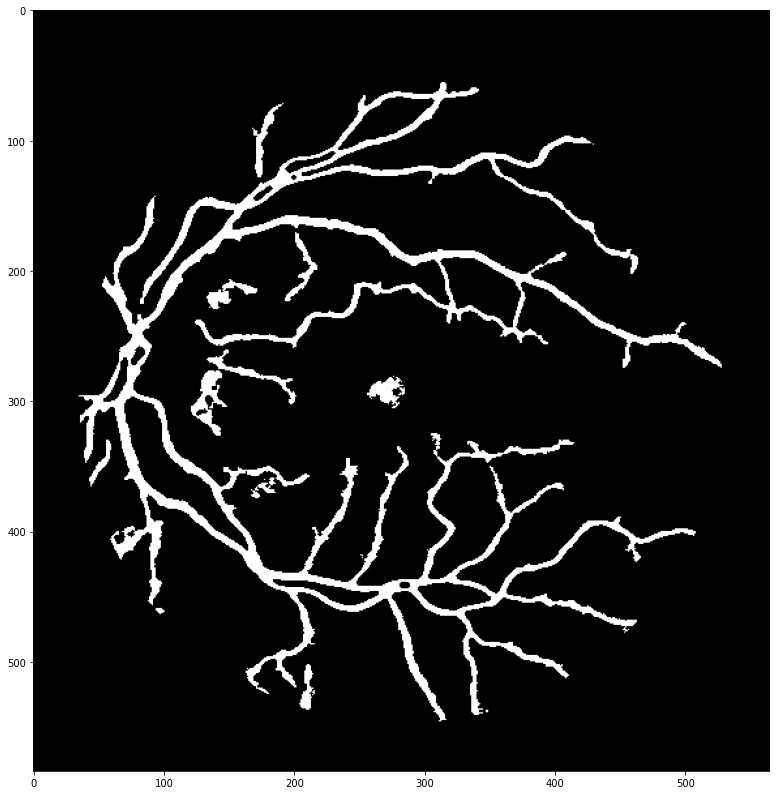

...

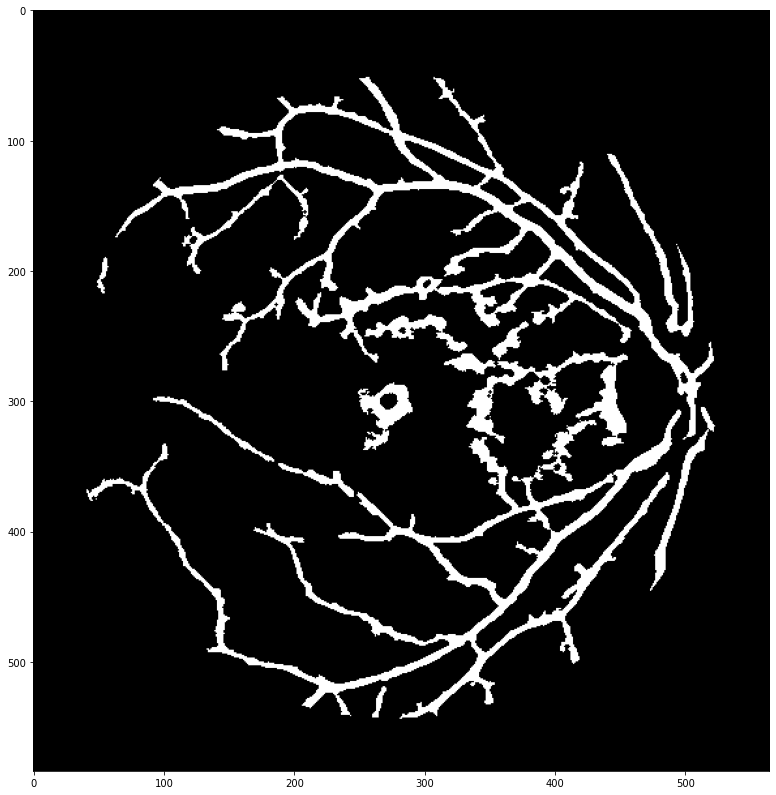

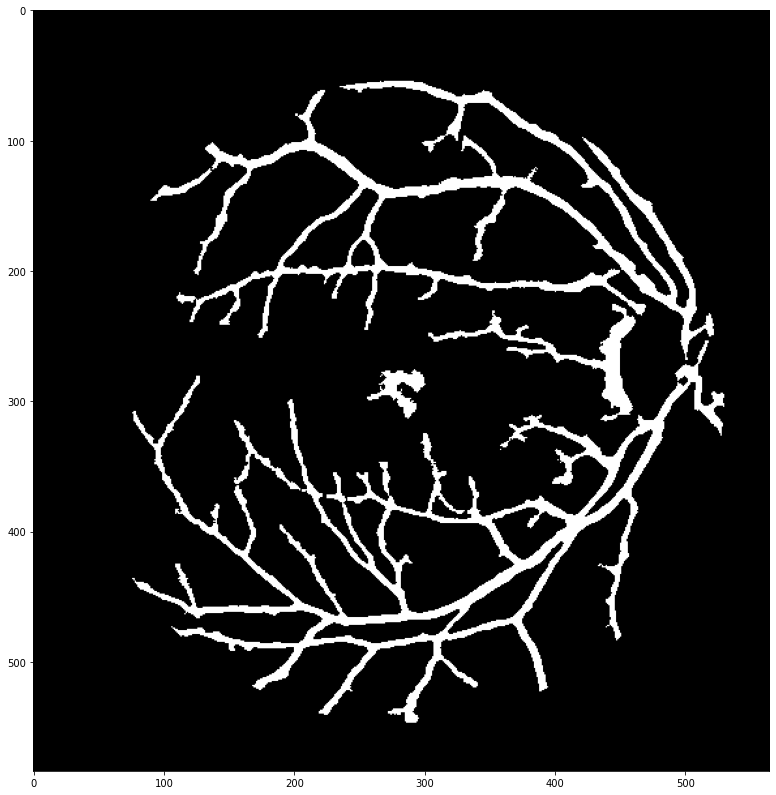

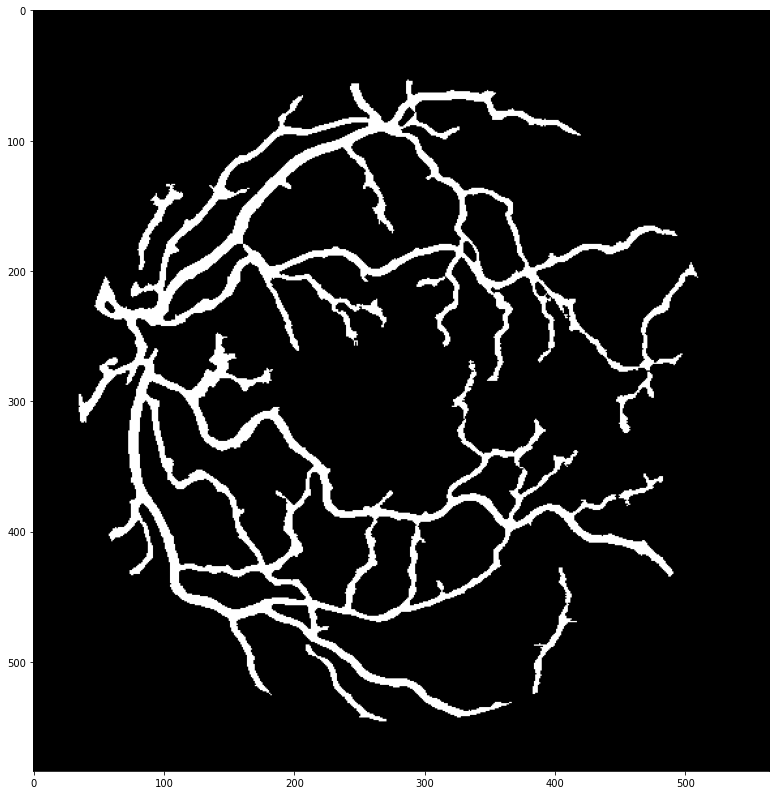

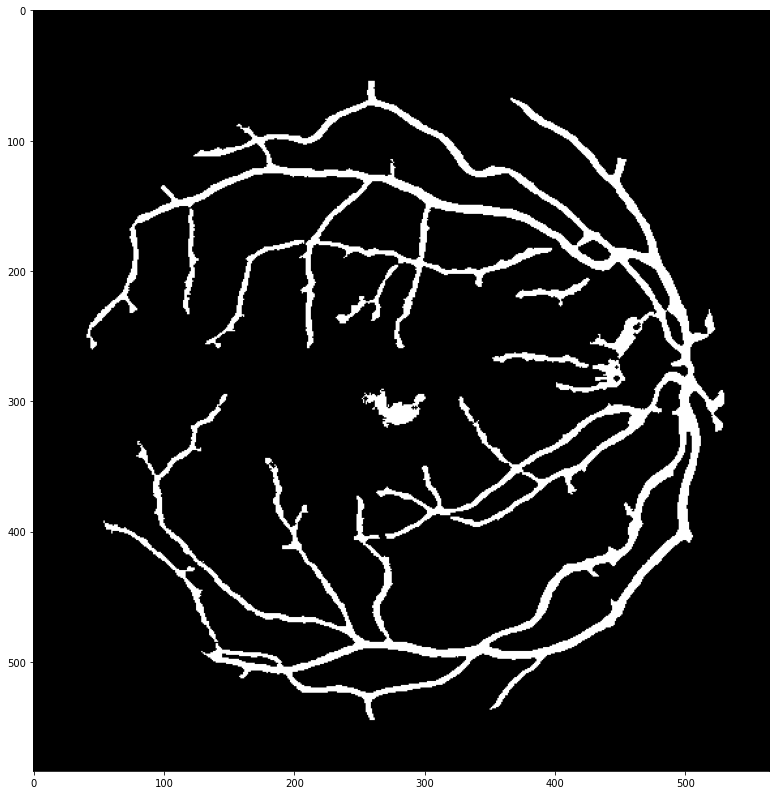

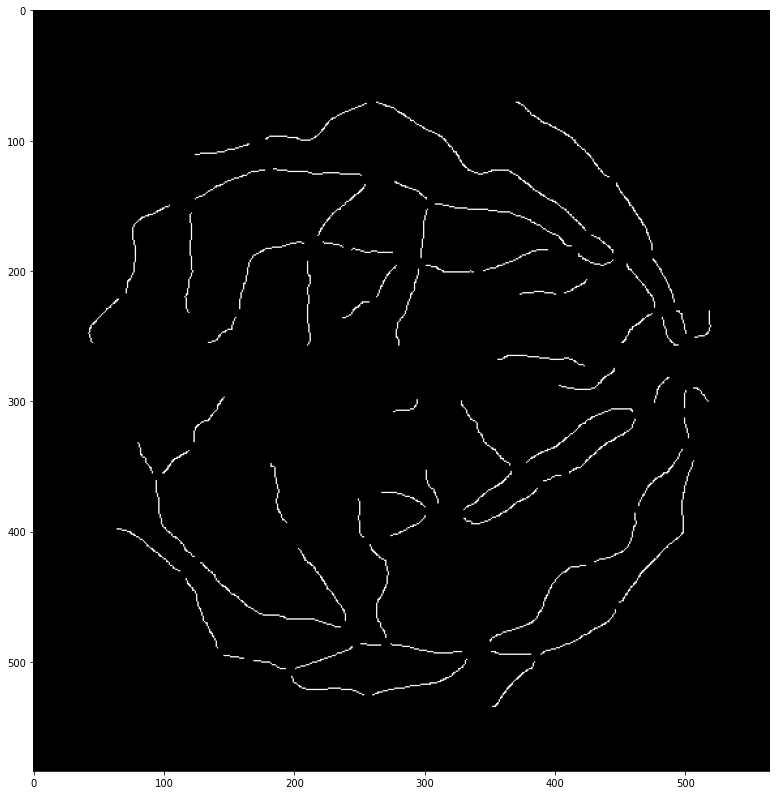

In [ ]:
# MEMANGGIL FUNGSI SEGMENTASI
img_number = 1
for i in sorted_file_paths:
  images = cv2.imread(i)
  out = []
  out = segmentasi(images)
  for i, f in enumerate(out):
    cv2.imwrite("Output-" + str(img_number) + ".png", f)
    img_number +=1

Evaluasi Metode Dice

In [ ]:
import numpy as np


def dice(im1, im2):

    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / (im1.sum() + im2.sum())

In [ ]:
im1=cv2.imread("/content/threshold/threshold-4.png")
im2=cv2.imread("/content/Output-4.png")

In [ ]:
dice(im1,im2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


0.845082536137852